In [1]:
import torch
import json
import h5py
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from maskrcnn_benchmark.data.datasets.evaluation.vg.sgg_eval import _compute_pred_matches

In [2]:
project_dir = 'speaker_prediction'
image_file = json.load(open(f'{project_dir}/datasets/vg/image_data.json'))
vocab_file = json.load(open(f'{project_dir}/datasets/vg/VG-SGG-dicts-with-attri.json'))
data_file = h5py.File(f'{project_dir}/datasets/vg/VG-SGG-with-attri.h5', 'r')

In [3]:
# load detected results
detected_origin_path = 'checkpoints/sgdet_ebd/inference/VG_stanford_filtered_with_attribute_test/'
detected_origin_result = torch.load(detected_origin_path + 'eval_results.pytorch')
detected_info = json.load(open(detected_origin_path + 'visual_info.json'))

In [10]:
# get image info by index
def get_info(idx, det_input):
    groundtruth = det_input['groundtruths'][idx]
    prediction = det_input['predictions'][idx]
    # boxes
    boxes = groundtruth.bbox
    boxes = np.array(boxes)
    pred_boxes = prediction.bbox
    pred_boxes = np.array(pred_boxes)

    # object labels
    idx2label = {"0": "_background_"}
    idx2label.update(vocab_file['idx_to_label'])
    labels = [idx2label[str(i)] for i in groundtruth.get_field('labels').tolist()]
    # print(prediction.get_field('pred_labels').tolist())
    pred_labels = [idx2label[str(int(i))] for i in prediction.get_field('pred_labels').tolist()]

    # groundtruth relation triplet
    idx2pred = vocab_file['idx_to_predicate']
    gt_rels = groundtruth.get_field('relation_tuple').tolist()
    gt_boxes_pairs = [np.hstack((boxes[i[0]], boxes[i[1]])) for i in gt_rels]
    gt_boxes_pairs = np.array(gt_boxes_pairs)
    gt_rels = [(labels[i[0]], idx2pred[str(i[2])], labels[i[1]]) for i in gt_rels]
    gt_rels = np.array(gt_rels)

    # prediction relation triplet
    pred_rel_pair = prediction.get_field('rel_pair_idxs').tolist()
    pred_rel_label = prediction.get_field('pred_rel_scores')
    pred_rel_label[:,0] = 0
    pred_rel_score, pred_rel_label = pred_rel_label.max(-1)

    pred_boxes_pairs = [np.hstack((pred_boxes[int(i[0])], pred_boxes[int(i[1])])) for i in pred_rel_pair]
    pred_boxes_pairs = np.array(pred_boxes_pairs)
    pred_rels = [(pred_labels[int(i[0])], idx2pred[str(j)], pred_labels[int(i[1])]) for i, j in zip(pred_rel_pair, pred_rel_label.tolist()) if j!=0]
    pred_rels = np.array(pred_rels)

    return gt_rels, pred_rels, gt_boxes_pairs, pred_boxes_pairs

def get_info_by_idx(idx, det_input, thres=0.5):
    groundtruth = det_input['groundtruths'][idx]
    prediction = det_input['predictions'][idx]
    # image path
    img_path = detected_info[idx]['img_file']
    # boxes
    boxes = groundtruth.bbox
    pred_boxes = prediction.bbox
    
    # object labels
    idx2label = {"0": "_background_"}
    idx2label.update(vocab_file['idx_to_label'])
    labels = ['{}-{}'.format(idx,idx2label[str(i)]) for idx, i in enumerate(groundtruth.get_field('labels').tolist())]
    pred_labels = ['{}-{}'.format(idx,idx2label[str(int(i))]) for idx, i in enumerate(prediction.get_field('pred_labels').tolist())]
    pred_scores = prediction.get_field('pred_scores')
    
    # groundtruth relation triplet
    idx2pred = vocab_file['idx_to_predicate']
    gt_rels = groundtruth.get_field('relation_tuple').tolist()
    gt_rels = [(labels[i[0]], idx2pred[str(i[2])], labels[i[1]]) for i in gt_rels]
    # prediction relation triplet
    pred_rel_pair = prediction.get_field('rel_pair_idxs').tolist()
    pred_rel_label = prediction.get_field('pred_rel_scores')
    pred_rel_label[:,0] = 0
    pred_rel_score, pred_rel_label = pred_rel_label.max(-1)
    
#     mask = pred_rel_score > thres
#     pred_rel_score = pred_rel_score[mask]
#     pred_rel_label = pred_rel_label[mask]

    pred_rels = [(pred_labels[int(i[0])], idx2pred[str(j)], pred_labels[int(i[1])]) for i, j in zip(pred_rel_pair, pred_rel_label.tolist()) if j!=0]
    return img_path, boxes, pred_boxes, labels, pred_labels, pred_scores, gt_rels, pred_rels, pred_rel_score, pred_rel_label

In [11]:
font = ImageFont.truetype('speaker_prediction/visualization/NotoSansJP-Bold.otf', 20)

def draw_image(pic, boxes, labels, rels, color='green'):
    draw = ImageDraw.Draw(pic)
    num_obj = boxes.shape[0]
    for i in range(num_obj):
        info = labels[i]
        box = boxes[i]
        x1,y1,x2,y2 = int(box[0]), int(box[1]), int(box[2]), int(box[3])
        draw.rectangle(((x1, y1), (x2, y2)), outline=color)
        text_width, text_height = font.getsize(info)
        draw.rectangle(((x1, y1-text_height), (x1+text_width, y1)), fill=color)
        draw.text((x1, y1-text_height), info, font=font)
    for item in rels:
        sub_idx = labels.index(item[0])
        sub_box = boxes[sub_idx]
        x1,y1,x2,y2 = int(sub_box[0]), int(sub_box[1]), int(sub_box[2]), int(sub_box[3])
        sub_x = (x1 + x2) / 2
        sub_y = (y1 + y2) / 2
        obj_idx = labels.index(item[2])
        obj_box = boxes[obj_idx]
        x1,y1,x2,y2 = int(obj_box[0]), int(obj_box[1]), int(obj_box[2]), int(obj_box[3])
        obj_x = (x1 + x2) / 2
        obj_y = (y1 + y2) / 2
        shape = [(sub_x,sub_y),(obj_x,obj_y)]
        draw.line(shape, fill=color, width=3)
        
def draw_pred(pic, boxes, labels, pred_rels, pred_correct):
    draw = ImageDraw.Draw(pic)
    for item in pred_rels:
        if item in pred_correct:
            color = 'green'
        else:
            color = 'red'
        sub_idx = labels.index(item[0])
        sub_box = boxes[sub_idx]
        x1,y1,x2,y2 = int(sub_box[0]), int(sub_box[1]), int(sub_box[2]), int(sub_box[3])
        sub_x = (x1 + x2) / 2
        sub_y = (y1 + y2) / 2
        draw.rectangle(((x1, y1), (x2, y2)), outline=color)
        text_width, text_height = font.getsize(item[0])
        draw.rectangle(((x1, y1-text_height), (x1+text_width, y1)), fill=color)
        draw.text((x1, y1-text_height), item[0], font=font)
        obj_idx = labels.index(item[2])
        obj_box = boxes[obj_idx]
        x1,y1,x2,y2 = int(obj_box[0]), int(obj_box[1]), int(obj_box[2]), int(obj_box[3])
        obj_x = (x1 + x2) / 2
        obj_y = (y1 + y2) / 2
        draw.rectangle(((x1, y1), (x2, y2)), outline=color)
        text_width, text_height = font.getsize(item[2])
        draw.rectangle(((x1, y1-text_height), (x1+text_width, y1)), fill=color)
        draw.text((x1, y1-text_height), item[2], font=font)
        shape = [(sub_x,sub_y),(obj_x,obj_y)]
        draw.line(shape, fill=color, width=3)

def print_list(name, input_list, scores):
    for i, item in enumerate(input_list):
        if scores == None:
            print(name + ' ' + str(i) + ': ' + str(item))
        else:
            print(name + ' ' + str(i) + ': ' + str(item) + '; score: ' + str(scores[i].item()))

def print_pred(name, pred, scores, pred_correct):
    for i, item in enumerate(pred):
        if item in pred_correct:
            print(str(name) + ' ' + str(i) + ': ' + str(item) + '; score: ' + str(scores[i].item()))
        else:
            print('\033[31m' + str(name) + ' ' + str(i) + ': ' + str(item) + '; score: ' + str(scores[i].item()) + '\033[0m')
    
def show_gt(img_path, boxes, pred_boxes, labels, pred_labels, pred_scores, gt_rels, pred_rels, pred_rel_score, pred_rel_label, print_img=True):
    pic = Image.open(img_path)
    draw_image(pic, boxes, labels, gt_rels)
    if print_img:
        display(pic)
    if print_img:
        print('*' * 50)
        print_list('gt_boxes', labels, None)
        print('*' * 50)
        print_list('gt_rels', gt_rels, None)
        print('*' * 50)
    return None

def show_pred(img_path, boxes, pred_boxes, labels, pred_labels, pred_scores, gt_rels, pred_rels, pred_rel_score, pred_rel_label, print_img=True):
    # select prediction that can cover all texts
    # text_list = [label for label in labels if 'text' in label]
    text_list = [gt_rel[2] for gt_rel in gt_rels]   # multiple speakers
    pred_list = [pred_rel[2] for pred_rel in pred_rels]
    indices = []
    for text in text_list:
        try:
            if pred_list.index(text) in indices:
                pred_list[pred_list.index(text)] = None
            indices.append(pred_list.index(text))
        except:
            pass
    pred_rels = [pred_rels[index] for index in indices]
    pred_correct = list(set(gt_rels).intersection(set(pred_rels)))
    
    pic = Image.open(img_path)
#     draw_image(pic, pred_boxes, pred_labels, pred_rels)
    draw_pred(pic, pred_boxes, pred_labels, pred_rels, pred_correct)
    if print_img:
        display(pic)
    if print_img:
        print('*' * 50)
        print_list('pred_labels', pred_labels, pred_scores)
        print('*' * 50)
        print_list('new_gt_rels', gt_rels, None)
        print('*' * 50)
        print_pred('pred_rels', pred_rels, pred_rel_score[indices], pred_correct)
        print('*' * 50)   
    return None

In [19]:
def show_selected(idx_list):
    for select_idx in idx_list:
        print(select_idx)
        show_gt(*get_info_by_idx(select_idx, detected_origin_result))
        gt_rels, pred_rels, gt_boxes_pairs, pred_boxes_pairs = get_info(select_idx, detected_origin_result)
        pred_to_gt = _compute_pred_matches(
                        gt_rels,
                        pred_rels,
                        gt_boxes_pairs,
                        pred_boxes_pairs,
                        iou_thres=0.65,
                        phrdet=False,
                    )
        gt_idxs = [idx for idx, i in enumerate(pred_to_gt) if i]

        img_path, boxes, pred_boxes, labels, pred_labels, pred_scores, gt_rels, pred_rels, pred_rel_score, pred_rel_label = get_info_by_idx(select_idx, detected_origin_result)
        gt_rels = [pred_rels[gt_idx] for gt_idx in gt_idxs]
        show_pred(img_path, boxes, pred_boxes, labels, pred_labels, pred_scores, gt_rels, pred_rels, pred_rel_score, pred_rel_label)
        
def show_all(start_idx, length):
    for cand_idx in range(start_idx, start_idx+length):
        print(f'Image {cand_idx}:')
        show_gt(*get_info_by_idx(cand_idx, detected_origin_result))
        show_pred(*get_info_by_idx(cand_idx, detected_origin_result))

3


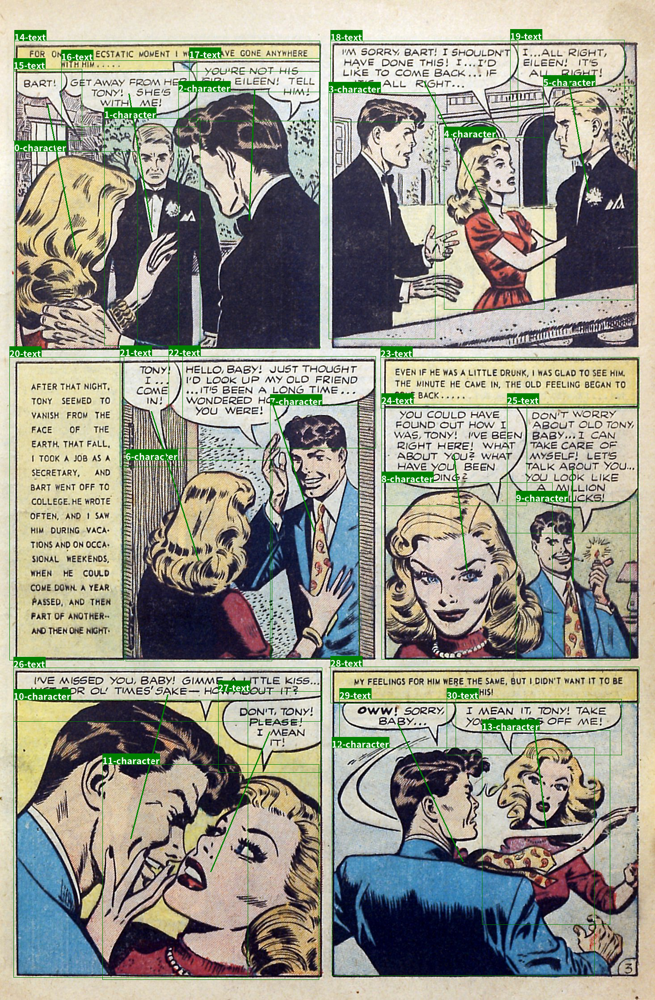

**************************************************
gt_boxes 0: 0-character
gt_boxes 1: 1-character
gt_boxes 2: 2-character
gt_boxes 3: 3-character
gt_boxes 4: 4-character
gt_boxes 5: 5-character
gt_boxes 6: 6-character
gt_boxes 7: 7-character
gt_boxes 8: 8-character
gt_boxes 9: 9-character
gt_boxes 10: 10-character
gt_boxes 11: 11-character
gt_boxes 12: 12-character
gt_boxes 13: 13-character
gt_boxes 14: 14-text
gt_boxes 15: 15-text
gt_boxes 16: 16-text
gt_boxes 17: 17-text
gt_boxes 18: 18-text
gt_boxes 19: 19-text
gt_boxes 20: 20-text
gt_boxes 21: 21-text
gt_boxes 22: 22-text
gt_boxes 23: 23-text
gt_boxes 24: 24-text
gt_boxes 25: 25-text
gt_boxes 26: 26-text
gt_boxes 27: 27-text
gt_boxes 28: 28-text
gt_boxes 29: 29-text
gt_boxes 30: 30-text
**************************************************
gt_rels 0: ('0-character', 'says', '15-text')
gt_rels 1: ('1-character', 'says', '16-text')
gt_rels 2: ('2-character', 'says', '17-text')
gt_rels 3: ('4-character', 'says', '18-text')
gt_rels 4: ('

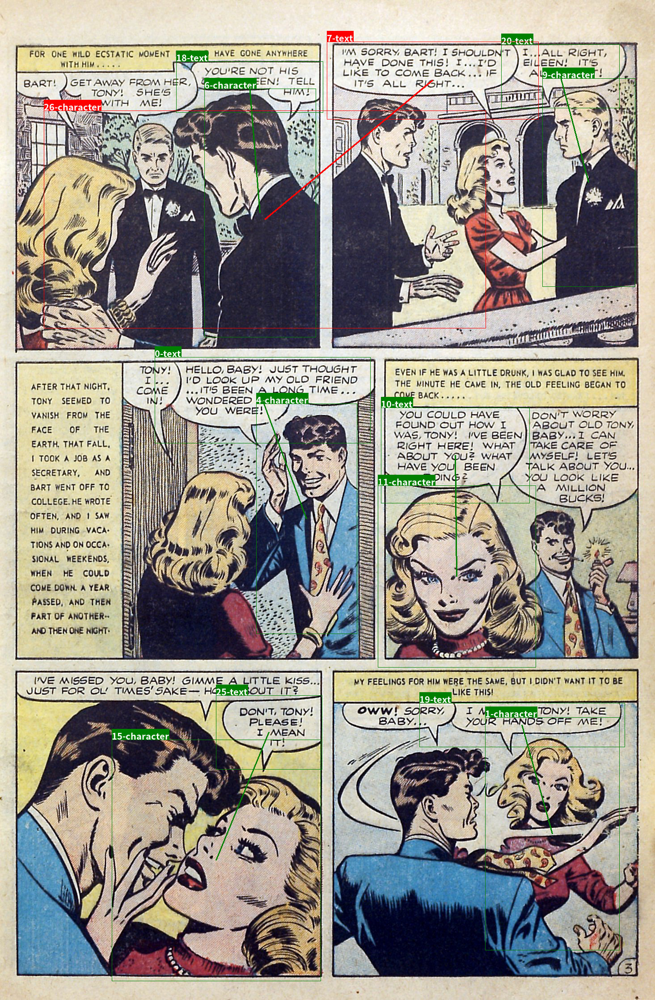

**************************************************
pred_labels 0: 0-text; score: 1.0
pred_labels 1: 1-character; score: 0.9999949932098389
pred_labels 2: 2-character; score: 0.9974101185798645
pred_labels 3: 3-text; score: 1.0
pred_labels 4: 4-character; score: 1.0
pred_labels 5: 5-character; score: 0.9999994039535522
pred_labels 6: 6-character; score: 0.9999998807907104
pred_labels 7: 7-text; score: 1.0
pred_labels 8: 8-text; score: 1.0
pred_labels 9: 9-character; score: 1.0
pred_labels 10: 10-text; score: 1.0
pred_labels 11: 11-character; score: 0.9999841451644897
pred_labels 12: 12-character; score: 1.0
pred_labels 13: 13-character; score: 1.0
pred_labels 14: 14-text; score: 1.0
pred_labels 15: 15-character; score: 0.999512791633606
pred_labels 16: 16-text; score: 1.0
pred_labels 17: 17-character; score: 0.9999170303344727
pred_labels 18: 18-text; score: 1.0
pred_labels 19: 19-text; score: 1.0
pred_labels 20: 20-text; score: 1.0
pred_labels 21: 21-text; score: 1.0
pred_labels 22: 22

In [20]:
# show_all(start_idx=1, length=1)
show_selected([3])